## pre-processing(배경 제거 및 배경 범위 줄이기)
### training image의 배경을 제거함 배경이 유사도를 구할 때, 성능 하락의 요인이 된다는 논문 존재(https://arxiv.org/pdf/2210.01615.pdf) 해당 논문을 근거로, 배경을 제거 후 유사도 학습. 뿐만 아니라 배경 영역을 줄이고 물체에 집중하도록 전처리 진행. 전처리 후 압축하여 저장함으로써 다시 재가공 할 필요 없음.

In [2]:
# background 제거를 위한 remove background 라이브러리 설치
!pip install rembg[gpu,cli]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 29.3 MB/s eta 0:00:0031m32.9 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 18.7 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 32.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 18.2 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5

In [14]:
import rembg

from rembg import remove

In [6]:
# training data도 배경을 지운 후 학습 진행
# !rembg p -m isnet-general-use '/content/과제2 비전을 활용한 스마트 검수 (사전 제공 데이터)/상품 이미지/' '/content/과제2 비전을 활용한 스마트 검수 (사전 제공 데이터)/상품 이미지_2/'

In [17]:
# 배경이 제거되면 전부 0픽셀이 됨. 필요한 영역만을 학습 이미지로 사용하기 위해 변환해주는 작업 진행
def remove_bg(img):

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    y_indices, x_indices = np.where(gray_img > 30)

    #print(y_indices, x_indices)
    # Calculate bounding box coordinates
    xmin = min(x_indices)
    xmax = max(x_indices)
    ymin = min(y_indices)
    ymax = max(y_indices)

    #print(xmin, ymin, xmax, ymax)

    return img[ymin:ymax, xmin:xmax, :]

for i in tqdm(sorted(glob.glob('./yes_train_rembg' + '/*.png'))):
  if i == 80:
      img = cv2.imread(i)
      img = remove_bg(img)

      cv2.imwrite('{}'.format(i), img)

  0%|          | 0/66 [00:00<?, ?it/s]

In [8]:
!rembg p -m isnet-general-use '/content/사리곰탕_큰사발면' '/content/사리곰탕_큰사발면_rembg'
!rembg p -m isnet-general-use '/content/튀김우동_큰사발면' '/content/튀김우동_큰사발면_rembg'
!rembg p -m isnet-general-use '/content/육개장_큰사발면' '/content/육개장_큰사발면_rembg'
!rembg p -m isnet-general-use '/content/오징어짬뽕_큰사발면' '/content/오징어짬뽕_큰사발면_rembg'
!rembg p -m isnet-general-use '/content/오징어짬뽕_컵' '/content/오징어짬뽕_컵_rembg'

100%|████████████████████████████████████████| 179M/179M [00:00<00:00, 758GB/s]
100% 5/5 [00:11<00:00,  2.20s/it]
100% 5/5 [00:09<00:00,  1.89s/it]
100% 4/4 [00:05<00:00,  1.45s/it]
100% 3/3 [00:05<00:00,  1.82s/it]
100% 5/5 [00:08<00:00,  1.69s/it]


## train
##유사도 학습
###SubCenterArcfaceLoss 바탕으로 유사도 기반 학습

In [9]:
!pip install --upgrade albumentations
!pip install pytorch-metric-learning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 2.5 MB/s eta 0:00:00


In [1]:
import random
import pandas as pd
import re
import glob
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# colab 환경에서는 cv2.imshow 함수가 작동하지 않기 때문에 cv2_imshow 함수로 대체

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import torchvision
from tqdm import tqdm

from pytorch_metric_learning import losses, testers

from tqdm.auto import tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score
# from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings(action='ignore')

from __future__ import print_function

from copy import copy

plt.ion()   # 대화형 모드

In [3]:
import numpy as np
import faiss


class KNeighborsClassifier:
    def __init__(self, n_neighbors=10):
        self.index = None
        self.y = None
        self.k = n_neighbors

    def fit(self, X, y):
        self.index = faiss.IndexFlatL2(X.shape[1])
        self.index.add(X.astype(np.float32))
        self.y = y

    def predict(self, X):
        distances, indices = self.index.search(X.astype(np.float32), k=self.k)
        votes = self.y[indices]
        predictions = np.array([np.argmax(np.bincount(x)) for x in votes])
        return predictions

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [22]:
CFG = {
    'IMG_SIZE':224,
    'EPOCHS':50,
    'LEARNING_RATE':5e-6,
    'EMBEDDING':256,
    'BATCH_SIZE':24,
    'SEED':42,
    'SAVE_IMAGE' : True
}

In [23]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(CFG['SEED']) # Seed 고정

In [24]:
class CustomDataset(Dataset):
    def __init__(self, img_path_list, label_list, transforms=None):
        self.img_path_list = img_path_list
        self.label_list = label_list
        self.transforms = transforms

    def __getitem__(self, index):
        img_path = self.img_path_list[index]

        image = cv2.imread(img_path)

        if self.transforms is not None:
            image = self.transforms(image=image)['image']

        if self.label_list is not None:
            label = self.label_list[index]
            return image, label
        else:
            return image

    def __len__(self):
        return len(self.img_path_list)

In [25]:
def custom_cutout(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    p = np.random.randint(0, 5 + 1)

    if p == 0:
      img[:, :x_center, :] = 0
    elif p == 1:
      img[:y_center, :, :] = 0

    elif p == 2:
      img[:, x_center:, :] = 0

    elif p == 3:
      img[y_center:, :, :] = 0

    # 고안사항
    # 카트 프레임에 의한 occlusion
    elif p == 4 or p == 5:
      ratio = np.random.uniform(0.1, 0.25)
      x_erase = int(img.shape[1] * ratio)
      y_erase = int(img.shape[0] * ratio)

      img[:, x_center - x_erase : x_center + x_erase, :] = 0
      img[y_center - y_erase : y_center + y_erase, :, :] = 0

    return img

def custom_cutout_v1(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    img[:, :x_center, :] = 0

    return img

def custom_cutout_v2(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    img[:y_center, :, :] = 0

    return img


def custom_cutout_v3(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    img[:, x_center:, :] = 0

    return img

def custom_cutout_v4(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    img[y_center:, :, :] = 0


    return img

def custom_cutout_v5(img):

    y_center = img.shape[0] // 2
    x_center = img.shape[1] // 2

    ratio = np.random.uniform(0.1, 0.25)
    x_erase = int(img.shape[1] * ratio)
    y_erase = int(img.shape[0] * ratio)

    img[:, x_center - x_erase : x_center + x_erase, :] = 0
    img[y_center - y_erase : y_center + y_erase, :, :] = 0

    return img

In [26]:
from albumentations.core.transforms_interface import ImageOnlyTransform
class CustomCutout(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout(img)

In [27]:
class CustomCutout_v1(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout_v1, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout_v1(img)

class CustomCutout_v2(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout_v2, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout_v2(img)

class CustomCutout_v3(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout_v3, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout_v3(img)

class CustomCutout_v4(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout_v4, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout_v4(img)

class CustomCutout_v5(ImageOnlyTransform):

    def __init__(
        self,
        always_apply=False,
        p=1):

        super(CustomCutout_v5, self).__init__(always_apply, p)


    def apply(self, img, **params):
        return custom_cutout_v5(img)

In [28]:
all_img_list = sorted(glob.glob('./content/상품 이미지_2' + '/*.png') +\
                      glob.glob('./content/사리곰탕_큰사발면_rembg' + '/*.png') +\
                      glob.glob('./content/튀김우동_큰사발면_rembg' + '/*.png') +\
                      glob.glob('./content/육개장_큰사발면_rembg' + '/*.png') +\
                      glob.glob('./content/오징어짬뽕_큰사발면_rembg' + '/*.png')
                      #glob.glob('/content/오징어짬뽕_컵_rembg' + '/.png')
                      )

df = pd.DataFrame(columns=['img_path', 'label'])
df['img_path'] = all_img_list
df['label'] = df['img_path'].apply(lambda x : int(str(x).split('/')[-1].split('.')[0].split('_')[-1][:-2]))


#le = LabelEncoder()
#df['label'] = le.fit_transform(df['label'])

train_transform = A.Compose([
                            # random crop 기능이 필요할 것으로 보임
                            # 즉, 일부만 봐도 바로 맞출 수 있는? 능력 필요
                            A.Resize(CFG['IMG_SIZE'] * 2, CFG['IMG_SIZE'] * 2),
                            A.augmentations.crops.transforms.RandomCrop(CFG['IMG_SIZE'],CFG['IMG_SIZE'], p = 0.5),
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout(p = 0.5),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            A.augmentations.dropout.cutout.Cutout(num_holes = 10, max_h_size = 30, max_w_size = 30, fill_value = 0, p = 0.5),
                            ToTensorV2()
                            ])


train_dataset = CustomDataset(df['img_path'].values, df['label'].values, train_transform)

In [29]:
# xml to csv
import xml.etree.ElementTree as et
import pandas as pd
def parse_XML(xml_file):
  BASE_path = './content/validation'
  out_df = pd.DataFrame(columns=['img_path', 'label', 'conf' , 'xmin', 'ymin', 'xmax', 'ymax'] )

  xtree = et.parse(xml_file)
  xroot = xtree.getroot()
  row = []

  folder_name = xroot.findtext("folder")
  img_name = xroot.findtext("filename")

  obj = xroot.findall("object")


  cls = [int(x.findtext("name").split('\t')[0]) for x in obj]

  bbox = [x[-1] for x in obj]

  xmin = [bb.findtext("xmin") for bb in bbox]
  ymin = [bb.findtext("ymin") for bb in bbox]
  xmax = [bb.findtext("xmax") for bb in bbox]
  ymax = [bb.findtext("ymax") for bb in bbox]

  #print(cls, xmin, ymin, xmax, ymax)

  for i in range(len(cls)):
    out_df = out_df.append({
        'img_path' : BASE_path + '/' + folder_name + '/' + img_name,
        'label' : cls[i],
        'conf' : 1,
        'xmin' : xmin[i],
        'ymin' : ymin[i],
        'xmax' : xmax[i],
        'ymax' : ymax[i]
    }, ignore_index = True)

  file_name = img_name.split('.')[0] + '.csv'

  out_df.to_csv(BASE_path + '/' + folder_name + '/GT_' + file_name, index = False)

import shutil
folder_list = os.listdir('./content/validation/')

for folder in folder_list:
  xml_list = sorted(glob.glob('./content/validation/' + folder + '/*.xml'))
  for xml_path in xml_list:
    parse_XML(xml_path)

## Validation dataset 생성

In [30]:
## validation img, csv 리스트 생성
folder_list = os.listdir('./content/validation/')

csv_list = []

output_df = pd.DataFrame(columns=['img_path', 'label'])

if os.path.exists('./content/valid_imgs'):
    shutil.rmtree('./content/valid_imgs')

os.mkdir('./content/valid_imgs')

for folder in folder_list:
  csv_list = sorted(glob.glob('./content/validation/' + folder  + '/GT_' + '*.csv'))
  #print(csv_list)
  for i in csv_list:
    tmp_path = copy(i)
    img_path = tmp_path.replace('GT_', '').replace('csv', 'jpg')
    df = pd.read_csv(i)

    img = cv2.imread(img_path)
    for j in range(len(df)):
      cls = df.loc[j, 'label']
      xmin, ymin, xmax, ymax = df.loc[j, 'xmin'], df.loc[j, 'ymin'], df.loc[j, 'xmax'], df.loc[j, 'ymax']
      save_img = img[int(ymin):int(ymax) + 1, int(xmin):int(xmax) + 1, :]


      file_name = i.split('/')[-1].split('.')[0] + '_' + str(j) + '.jpg'
      save_path = './content/valid_imgs/' + file_name

      cv2.imwrite(save_path, save_img)

      output_df = output_df.append({
          'img_path' : save_path,
          'label' : cls
      }, ignore_index = True)

In [31]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

In [32]:
valid_transform = A.Compose([
                            A.augmentations.geometric.transforms.PadIfNeeded (min_height=384, min_width=384, always_apply=False, p=1.0),
                            A.augmentations.crops.transforms.CenterCrop(CFG['IMG_SIZE'],CFG['IMG_SIZE'], p = 1.0),
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            ToTensorV2()
                            ])

valid_dataset = CustomDataset(output_df['img_path'].values, output_df['label'].values, valid_transform)

valid_loader = DataLoader(valid_dataset, batch_size = CFG['BATCH_SIZE'], shuffle = False,
                          num_workers= 8,
                          worker_init_fn = seed_worker)

In [33]:
class DINO_FACE(nn.Module):
    def __init__(self):
        super(DINO_FACE, self).__init__()
        self.model = torch.hub.load('facebookresearch/dinov2', f'dinov2_vitg14')

    def forward(self, img):

        o = self.model(img)
        return o

In [34]:
# 기본 이미지

all_img_list = sorted(glob.glob('./content/상품 이미지_2' + '/*.png') +\
                      glob.glob('./content/사리곰탕_큰사발면_rembg' + '/.png') +\
                      glob.glob('./content/튀김우동_큰사발면_rembg' + '/.png') +\
                      glob.glob('./content/육개장_큰사발면_rembg' + '/.png') +\
                      glob.glob('./content/오징어짬뽕_큰사발면_rembg' + '/.png')
                      #glob.glob('/content/오징어짬뽕_컵_rembg' + '/.png')
                      )

df = pd.DataFrame(columns=['img_path', 'label'])
df['img_path'] = all_img_list
df['label'] = df['img_path'].apply(lambda x : int(str(x).split('/')[-1].split('.')[0].split('_')[-1][:-2]))


embed_transform1 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            ToTensorV2()
                            ])

# Random Crop
embed_transform2 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'] * 2, CFG['IMG_SIZE'] * 2),
                            A.augmentations.crops.transforms.RandomCrop(CFG['IMG_SIZE'],CFG['IMG_SIZE'], p = 1),
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 위쪽 50% 가림
embed_transform3 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v1(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 아래쪽 50% 가림
embed_transform4 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v2(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 왼쪽 50% 가림
embed_transform5 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v3(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 오른쪽 50% 가림
embed_transform6 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v4(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])


# CustomCutout Frame Occlusion 대비
embed_transform7 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v5(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# KNN을 위한 Database 구축
embed_dataset = CustomDataset(df['img_path'].values, df['label'].values, embed_transform1) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform2) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform3) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform4) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform5) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform6) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform7)

In [35]:
def train(model, train_dataset):
    ang_loss_fn = losses.ArcFaceLoss(num_classes=117, embedding_size = 1536, margin= 20)
    loss_optim = torch.optim.AdamW(ang_loss_fn.parameters(), lr=CFG["LEARNING_RATE"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=CFG["LEARNING_RATE"])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer=optimizer, T_0 = 10, T_mult = 1, verbose=False)
    scaler = torch.cuda.amp.GradScaler()
    train_loader = DataLoader(train_dataset, batch_size=CFG['BATCH_SIZE'], shuffle = True, drop_last=True, pin_memory=True,
                              num_workers= 8,
                              worker_init_fn = seed_worker)

    best_val_score = 0
    best_model = None

    for e in range(1, CFG['EPOCHS']+1):
        train_loss = train_one_epoch(model, train_loader, optimizer, scheduler, loss_optim, ang_loss_fn, scaler)
        #if e % 5 == 0:
        if e%30 == 0:
            valid_score = valid_one_epoch(model, embed_dataset, valid_dataset)
            print(valid_score)
            valid_score = np.mean(valid_score)
            if best_val_score<valid_score:
                best_val_score=valid_score
                best_model = model
                print(f"save best model at epoch{e}")

        scheduler.step()

    return best_model, model, ang_loss_fn

def train_one_epoch(model, train_loader, optimizer, scheduler, loss_optim, ang_loss_fn, scaler):
    model.train()
    running_ang_loss = []
    prog_bar = tqdm(enumerate(train_loader), total=len(train_loader))
    for batch, (imgs, labels) in prog_bar:
        optimizer.zero_grad()
        loss_optim.zero_grad()
        imgs = imgs.to(device, torch.float)
        labels = labels.to(device, torch.long)

        with torch.autocast(device_type=device.type, dtype=torch.float16 if device.type == 'cuda' else torch.bfloat16):
            embed = model(imgs)
            loss = ang_loss_fn(embed, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.step(loss_optim)
        scaler.update()

        running_ang_loss.append(loss.item())
        prog_bar.set_description(f"ang_loss: {np.mean(running_ang_loss):.4f}")

    return np.mean(running_ang_loss)

def get_embeddings_with_label(model, dataset):
    model.eval()
    loader = DataLoader(dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False, pin_memory=True,
                        num_workers= 8,
                        worker_init_fn = seed_worker)
    prog_bar = tqdm(enumerate(loader), total=len(loader))
    embeddings = []
    all_labels = []
    with torch.no_grad():
      for batch, (imgs, labels) in prog_bar:
          imgs = imgs.to(device, torch.float)
          embed = model(imgs)
          embed = F.normalize(embed).cpu().detach().numpy()
          labels = labels.numpy()
          embeddings+= embed.tolist()
          all_labels+= labels.flatten().tolist()

    return np.array(embeddings), np.array(all_labels)


def valid_one_epoch(model, train_dataset, valid_dataset):
    model.eval()
    with torch.no_grad():
      train_embed, train_labels = get_embeddings_with_label(model, train_dataset)
      valid_embed, valid_labels = get_embeddings_with_label(model, valid_dataset)
      clf = KNeighborsClassifier(n_neighbors=5)
      clf.fit(train_embed, train_labels)
      valid_preds = clf.predict(valid_embed)

      score = accuracy_score(valid_labels, valid_preds)
    return score

In [36]:
model2 = DINO_FACE().to(device)
model2 = torch.nn.DataParallel(model2).to(device)

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


## Best epoch : 62 / Best Val Acc : 76%
## 예선 전 Fine-Tuning 시 Hyperparameter로 참고

In [37]:
best_model2, final_model2, loss_func = train(model2, train_dataset)

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/191 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

0.7339901477832512
save best model at epoch30


  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

In [38]:
torch.save({
    'model' : final_model2,
    'state_dict' : final_model2.state_dict()
}, './vitg_checkpoint_additional_v3_emb1536_b24_e50_final.pt')

In [39]:
torch.save({
    'model' : best_model2,
    'state_dict' : best_model2.state_dict()
}, './vitg_checkpoint_additional_v3_emb1536_b24_e30_final.pt')

In [48]:
!ls

CODE_OF_CONDUCT.md  cog.yaml  detic		 requirements.txt
CONTRIBUTING.md     configs   docs		 third_party
LICENSE		    datasets  lazy_train_net.py  tools
README.md	    demo.py   predict.py	 train_net.py


# Parse

## 예선전에 들어오는 txt file parsing

In [53]:
# txt to csv
def parse_txt(txt_path):
  out_df = pd.DataFrame(columns=['img_path', 'label', 'conf' , 'xmin', 'ymin', 'xmax', 'ymax'] )

  img_path = txt_path[:-3] + 'jpg'

  with open(txt_path, 'r') as f:
    lines = f.readlines()
    for data in lines:
      cls, x_cen, y_cen, width, height = data.split(' ')[0], data.split(' ')[1], data.split(' ')[2], data.split(' ')[3], data.split(' ')[4]
      x_min = int(x_cen) - int(width) // 2
      y_min = int(y_cen) - int(height) // 2
      x_max = int(x_cen) + int(width) // 2
      y_max = int(y_cen) + int(height) // 2

      out_df = out_df.append({
          'img_path' : img_path,
          'label' : cls,
          'conf' : 1,
          'xmin' : x_min,
          'ymin' : y_min,
          'xmax' : x_max,
          'ymax' : y_max
      }, ignore_index = True)

  img_name_jpg = img_path.split('/')[-1]
  img_name = img_name_jpg.split('.')[0]

  out_df.to_csv(img_path.replace(img_name_jpg, 'GT_' + img_name + '.csv'), index = False)

import shutil
folder_list = os.listdir('../content/validation')

for folder in folder_list:
  txt_list = sorted(glob.glob('../content/validation/' + folder + '/*.txt'))
  for txt_path in txt_list:
    parse_txt(txt_path)

## test

In [54]:
# Install detectron2
import torch
from tqdm import tqdm
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Use the below line to install detectron2
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

torch:  1.12 ; cuda:  cu116


In [41]:
# clone and install Detic
#!git clone https://github.com/facebookresearch/Detic.git --recurse-submodules
%cd Detic
#!pip install -r requirements.txt

/competition/cjlogistics/Detic


In [55]:
!ls

CODE_OF_CONDUCT.md  cog.yaml  detic		 requirements.txt
CONTRIBUTING.md     configs   docs		 third_party
LICENSE		    datasets  lazy_train_net.py  tools
README.md	    demo.py   predict.py	 train_net.py


In [42]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import sys
import numpy as np
import os, json, cv2, random

# 라이센스: BSD
# 저자: Ghassen Hamrouni

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Detic libraries
sys.path.insert(0, 'third_party/CenterNet2/')
from centernet.config import add_centernet_config
from detic.config import add_detic_config
from detic.modeling.utils import reset_cls_test

In [43]:
# Build the detector and download our pretrained weights
cfg = get_cfg()
add_centernet_config(cfg)
add_detic_config(cfg)
cfg.merge_from_file("configs/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.yaml")
cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detic/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.45  # set threshold for this model
cfg.MODEL.ROI_BOX_HEAD.ZEROSHOT_WEIGHT_PATH = 'rand'
cfg.MODEL.ROI_HEADS.ONE_CLASS_PER_PROPOSAL = True # For better visualization purpose. Set to False for all classes.
# cfg.MODEL.DEVICE='cpu' # uncomment this to use cpu-only mode.
predictor = DefaultPredictor(cfg)

[08/21 01:26:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detic/Detic_LCOCOI21k_CLIP_SwinB_896b32_4x_ft4x_max-size.pth ...


In [44]:
# Setup the model's vocabulary using build-in datasets

BUILDIN_CLASSIFIER = {
    'lvis': 'datasets/metadata/lvis_v1_clip_a+cname.npy',
    'objects365': 'datasets/metadata/o365_clip_a+cnamefix.npy',
    'openimages': 'datasets/metadata/oid_clip_a+cname.npy',
    'coco': 'datasets/metadata/coco_clip_a+cname.npy',
}

BUILDIN_METADATA_PATH = {
    'lvis': 'lvis_v1_val',
    'objects365': 'objects365_v2_val',
    'openimages': 'oid_val_expanded',
    'coco': 'coco_2017_val',
}

vocabulary = 'lvis' # change to 'lvis', 'objects365', 'openimages', or 'coco'
metadata = MetadataCatalog.get(BUILDIN_METADATA_PATH[vocabulary])
classifier = BUILDIN_CLASSIFIER[vocabulary]
num_classes = len(metadata.thing_classes)
reset_cls_test(predictor.model, classifier, num_classes)

Resetting zs_weight datasets/metadata/lvis_v1_clip_a+cname.npy


In [45]:
# Change the model's vocabulary to a customized one and get their word-embedding
#  using a pre-trained CLIP model.

from detic.modeling.text.text_encoder import build_text_encoder
def get_clip_embeddings(vocabulary, prompt='a '):
    text_encoder = build_text_encoder(pretrain=True)
    text_encoder.eval()
    texts = [prompt + x for x in vocabulary]
    emb = text_encoder(texts).detach().permute(1, 0).contiguous().cpu()
    return emb

vocabulary = 'custom'
metadata = MetadataCatalog.get("__unused_3")
metadata.thing_classes = ['bottle', 'beer_can', 'box', 'pop_(soda)', 'can', 'sharpie', 'mouse_(computer_equipment)', 'toothpaste', 'carton', 'plastic_bag', 'shoe', 'signboard', 'water_bottle', 'water_jug', 'orange_(fruit)', 'umbrella'] # Change here to try your own vocabularies!
classifier = get_clip_embeddings(metadata.thing_classes)
num_classes = len(metadata.thing_classes)
reset_cls_test(predictor.model, classifier, num_classes)
# Reset visualization threshold
output_score_threshold = 0.4
for cascade_stages in range(len(predictor.model.roi_heads.box_predictor)):
    predictor.model.roi_heads.box_predictor[cascade_stages].test_score_thresh = output_score_threshold

Loading pretrained CLIP


In [56]:
def inference(model, test_loader, device):
    model.to(device)
    model.eval()
    predictions = []
    with torch.no_grad():
        for imgs in tqdm(iter(test_loader)):
            imgs = imgs.float().to(device)

            embed = model(imgs)
            embed = F.normalize(embed).cpu().detach().numpy()
            # 0이 아닌 모든 index 저장
            pred = clf.predict(embed)

            predictions += list(pred)
    return np.array(predictions)

In [57]:
checkpoint = torch.load('../vitg_checkpoint_additional_v3_emb1536_b24_e50_final.pt')
model2 = checkpoint['model']
model2.load_state_dict(checkpoint['state_dict'])

seed_everything(2023) # Seed 고정

all_img_list = sorted(glob.glob('../content/상품 이미지_2' + '/*.png') +\
                      glob.glob('../content/사리곰탕_큰사발면_rembg' + '/.png') +\
                      glob.glob('../content/튀김우동_큰사발면_rembg' + '/.png') +\
                      glob.glob('../content/육개장_큰사발면_rembg' + '/.png') +\
                      glob.glob('../content/오징어짬뽕_큰사발면_rembg' + '/.png')
                      #glob.glob('/content/오징어짬뽕_컵_rembg' + '/.png')
                      )

df = pd.DataFrame(columns=['img_path', 'label'])
df['img_path'] = all_img_list
df['label'] = df['img_path'].apply(lambda x : int(str(x).split('/')[-1].split('.')[0].split('_')[-1][:-2]))


# 기본 이미지
embed_transform1 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            ToTensorV2()
                            ])

# Random Crop
embed_transform2 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'] * 2, CFG['IMG_SIZE'] * 2),
                            A.augmentations.crops.transforms.RandomCrop(CFG['IMG_SIZE'],CFG['IMG_SIZE'], p = 1),
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 위쪽 50% 가림
embed_transform3 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v1(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 아래쪽 50% 가림
embed_transform4 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v2(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 왼쪽 50% 가림
embed_transform5 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v3(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# CustomCutout 오른쪽 50% 가림
embed_transform6 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v4(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])


# CustomCutout Frame Occlusion 대비
embed_transform7 = A.Compose([
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            CustomCutout_v5(p = 1),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            A.augmentations.geometric.transforms.HorizontalFlip(p=0.5),
                            A.augmentations.geometric.transforms.VerticalFlip(p=0.5),
                            A.augmentations.transforms.RandomBrightness(limit = 0.2, p=0.5),
                            A.augmentations.transforms.RandomContrast(limit = 0.2, p=0.5),
                            A.augmentations.geometric.rotate.Rotate(p = 0.5),
                            ToTensorV2()
                            ])

# KNN을 위한 Database 구축
embed_dataset = CustomDataset(df['img_path'].values, df['label'].values, embed_transform1) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform2) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform3) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform4) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform5) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform6) + CustomDataset(df['img_path'].values, df['label'].values, embed_transform7)

train_embed, train_labels = get_embeddings_with_label(model2, embed_dataset)
clf = KNeighborsClassifier(n_neighbors=10)
clf.fit(train_embed, train_labels)

100%|█████████████████████████████████████████████████████████████████████| 191/191 [03:11<00:00,  1.00s/it]


In [58]:
test_transform = A.Compose([
                            A.augmentations.geometric.transforms.PadIfNeeded (min_height=384, min_width=384, always_apply=False, p=1.0),
                            A.augmentations.crops.transforms.CenterCrop(CFG['IMG_SIZE'],CFG['IMG_SIZE'], p = 1.0),
                            A.Resize(CFG['IMG_SIZE'],CFG['IMG_SIZE']),
                            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, always_apply=False, p=1.0),
                            ToTensorV2()
                            ])

### prediction : Detic 모델은 instance segmentation까지도 수행이 가능함.
### bounding box의 경우 주위의 다른 객체를 포함하는 가능성이 높음
### 반면, instance segmentation mask의 경우는 오직 각 객체만을 masking 하게 됨.
### 따라서 mask를 기준으로 bounding box를 만들게 되면,
### 기존의 bounding box보다 좀 더 세밀한(주위의 다른 객체를 덜 담고, 본 객체에 좀 더 집중하는) bounding box를 얻을 수 있음

In [65]:
# data = outputs["instances"].pred_boxes[idx]
def save_jpg(ori_path, save_path, datas):
  df = pd.DataFrame(columns=['img_path', 'label', 'conf', 'xmin', 'ymin', 'xmax', 'ymax'])
  # ori_path : 원본 이미지 path
  # data : box 위치
  img = cv2.imread(ori_path)
  for idx in range(len(datas["instances"])):
    # instance segmentation mask의 xmin, ymin, xmax, ymax 값만을 bbox 좌표로 사용해보자.
    pred_mask = datas["instances"].pred_masks.cpu().numpy()[idx, :, :]
    cls = datas["instances"].pred_classes.cpu().numpy()[idx]
    conf = datas["instances"].scores.cpu().numpy()[idx]

    x_min, y_min, x_max, y_max = datas["instances"].pred_boxes.tensor.cpu().numpy()[idx,:]

    # pre-train clip을 쓰게 된다면
    #if metadata.thing_classes[cls] not in ['bottle', 'beer_can', 'box', 'pop_(soda)', 'can', 'sharpie', 'mouse_(computer_equipment)', 'toothpaste', 'carton', 'plastic_bag', 'shoe', 'signboard', 'water_bottle', 'water_jug', 'orange_(fruit)'] :
    #  continue

    # box, bottle, can으로 할 거면 사용
    # 박스라고 판단되면 방해되는 배경 요소를 제거
    # 보통 위쪽에 같이 쌓인 박스에 의해 최종 분류가 실패하는 경우가 많음

    if metadata.thing_classes[cls] == 'box':
        ratio = 0.1
        y_height = int(y_max - y_min)

        y_erase = int(y_height * ratio)

        y_min = y_min + y_erase

    save_img = img[int(y_min):int(y_max), int(x_min):int(x_max), :]

    img_path = save_path + '/img_' + str(idx) + '.jpg'
    df = df.append({
        'img_path' : ori_path,
        'box_img_path' : img_path,
        'label' : cls,
        'conf' : conf,
        'xmin' : int(x_min),
        'ymin' : int(y_min),
        'xmax' : int(x_max),
        'ymax' : int(y_max),
     }, ignore_index = True)

    if os.path.exists(img_path):
      os.remove(img_path)
    cv2.imwrite(img_path, save_img)

  return df

In [66]:
def calculate_iou(box1, box2):
  # box = [x1, y1, x2, y2]
  box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
  box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)
  #print(box1[2] - box1[0], box1[3] - box1[1], box2[2] - box2[0], box2[3] - box2[1])
  # obtain x1, y1, x2, y2 of the intersection
  x1 = max(box1[0], box2[0])
  y1 = max(box1[1], box2[1])
  x2 = min(box1[2], box2[2])
  y2 = min(box1[3], box2[3])

  # compute the width and height of the intersection
  w = max(0, x2 - x1 + 1)
  h = max(0, y2 - y1 + 1)

  inter = w * h
  iou = inter / (box1_area + box2_area - inter)
  return iou

In [67]:
box_list = [1, 2, 3, 5, 6, 8, 10, 11,
            13, 17, 18, 23, 24, 25, 26, 31,
            32, 34, 40, 41, 42, 43, 46, 49,
            50, 51, 55, 56, 57, 58, 63, 64,
            65, 67, 70, 72, 75, 76, 81, 88,
            90, 91, 95, 96, 100, 105, 107, 108,
            109, 110, 111, 113, 114]

def nms(df, thres):
    result_df = pd.DataFrame(columns=['img_path', 'box_img_path', 'label', 'conf', 'xmin', 'ymin', 'xmax', 'ymax'])
    for i in range(0, 115):
      new_df = df[df['label'] == i].reset_index(drop = True)
      x1 = new_df['xmin'].to_numpy()
      y1 = new_df['ymin'].to_numpy()
      x2 = new_df['xmax'].to_numpy()
      y2 = new_df['ymax'].to_numpy()

      scores = new_df['conf'].to_numpy()

      areas = (x2 - x1 + 1) * (y2 - y1 + 1)
      order = scores.argsort()[::-1]

      keep = []
      while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        ovr = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(ovr <= thres)[0]
        order = order[inds + 1]

      tmp_df = new_df.iloc[keep, :].reset_index(drop = True)

      result_df = pd.concat([result_df,tmp_df])

    return result_df

def save_df(img_path):
    output_df = pd.DataFrame(columns=['img_path', 'box_img_path', 'label', 'conf', 'xmin', 'ymin', 'xmax', 'ymax'])
    for i in range(0, 115):

      # 1. 같은 label인 것들만 slicing
      new_df = df2[df2['label'] == i].reset_index(drop = True)

      # 2.
      for j in range(len(new_df)):
        xmin, ymin, xmax, ymax = int(new_df.loc[j, 'xmin']), int(new_df.loc[j, 'ymin']), int(new_df.loc[j, 'xmax']), int(new_df.loc[j, 'ymax'])

        # 중심점 찾기
        xcen, ycen = xmin + (xmax - xmin) // 2, ymin + (ymax - ymin) // 2

        # 가로 세로 너비 찾기
        xr, yr = xcen - xmin, ycen - ymin

        # (v2) 추가적으로 짧은 쪽 찾아서 짧은 쪽만 2배 늘려주기
        shorter_side = 0
        min_value = min(xr, yr)
        if min_value == xr:
          shorter_side = xr
          longer_side = yr
        else:
          shorter_side = yr
          longer_side = xr

        ## 긴 쪽 / 짧은 쪽 비율이 2 이상이라면
        ## detic에서 instance가 아닌 묶음으로 검출된 객체
        if (longer_side / shorter_side) >= 2:
          flag = 1
        else:
          flag = 0

        if shorter_side == xr:
          nxmin, nymin, nxmax, nymax = xmin - xr, ymin, xmax + xr, ymax
        else:
          nxmin, nymin, nxmax, nymax = xmin, ymin - yr, xmax, ymax + yr

        if nxmin < 0 :
          nxmin = 0
        if nymin < 0 :
          nymin = 0

        # (v3) 애초에 묶음으로 잡히는 박스종류의 경우는 그대로 상자 고정
        if i in box_list:
          box_j = [xmin, ymin, xmax, ymax]
        else:
          if flag == 1:
            box_j = [nxmin, nymin, nxmax, nymax]
          elif flag == 0:
            box_j = [xmin, ymin, xmax, ymax]
        box_final = [xmin, ymin, xmax, ymax]
        # 해당 박스 좌표와 다른 index의 박스 좌표간 iou 구하기

        for k in range(0, len(new_df)):
          # 자기 자신 제외
          if k!=j:
            # IoU 계산
            box_k = [new_df.loc[k, 'xmin'], new_df.loc[k, 'ymin'], new_df.loc[k, 'xmax'], new_df.loc[k, 'ymax']]
            iou = calculate_iou(box_j, box_k)

            # box 종류라면 iou 기준을 엄격하게 적용
            if i in box_list:
              if iou > 0.35:
                box_final[0] = min(box_k[0], box_final[0])
                box_final[1] = min(box_k[1], box_final[1])
                box_final[2] = max(box_k[2], box_final[2])
                box_final[3] = max(box_k[3], box_final[3])

            # 음료수 종류라면
            else:
              # 애초에 묶음으로 봤다면
              if flag == 1:
                if iou > 0.25:
                  box_final[0] = min(box_k[0], box_final[0])
                  box_final[1] = min(box_k[1], box_final[1])
                  box_final[2] = max(box_k[2], box_final[2])
                  box_final[3] = max(box_k[3], box_final[3])
              # instance로 봤다면
              elif flag == 0:
                if iou > 0.1:
                  box_final[0] = min(box_k[0], box_final[0])
                  box_final[1] = min(box_k[1], box_final[1])
                  box_final[2] = max(box_k[2], box_final[2])
                  box_final[3] = max(box_k[3], box_final[3])


        output_df = output_df.append({
            'img_path' : new_df.loc[j, 'img_path'],
            'box_img_path' : new_df.loc[j, 'box_img_path'],
            'label' : new_df.loc[j, 'label'],
            'conf' : new_df.loc[j, 'conf'],
            'xmin' : box_final[0],
            'ymin' : box_final[1],
            'xmax' : box_final[2],
            'ymax' : box_final[3],
        }, ignore_index = True)

    tmp_path = img_path[:-4]
    
    print(img_path, tmp_path)

    output_df = nms(output_df, 0.2)
    output_df.to_csv(tmp_path  + '.csv', index = False)

In [68]:
def make_iou_csv(image_path):
  final_df = pd.DataFrame(columns = ['img_path', 'label', 'conf' , 'xmin', 'ymin', 'xmax', 'ymax', 'IoU'] )
  image_name = image_path.split('/')[-1][:-4]
    
  gt_df_path = image_path.replace(image_name, 'GT_' + image_name).replace('jpg', 'csv')
  pred_df_path = image_path.replace('jpg', 'csv')

  print(image_path, image_name, gt_df_path, pred_df_path)

  if os.path.exists(gt_df_path):
    gt_csv = pd.read_csv(gt_df_path)
    tmp_list = copy(gt_df_path)
    pred_csv = pd.read_csv(pred_df_path)

    for j in range(1, 115):
      gt_df = gt_csv[gt_csv['label'] == j].reset_index(drop = True)
      pred_df = pred_csv[pred_csv['label'] == j].reset_index(drop = True)

      # GT 박스와 pred 박스가 모두 존재할 때만 계산이 가능함
      if len(gt_df) != 0 and len(pred_df) !=0:

        for k in range(len(pred_df)):
          iou = 0
          pbox = [pred_df.loc[k,'xmin'], pred_df.loc[k,'ymin'], pred_df.loc[k,'xmax'], pred_df.loc[k,'ymax']]
          for l in range(len(gt_df)):
            gbox = [gt_df.loc[l,'xmin'], gt_df.loc[l,'ymin'], gt_df.loc[l,'xmax'], gt_df.loc[l,'ymax']]

            iou = max(calculate_iou(gbox, pbox),iou)

          #if iou >= 0.5:
          final_df = final_df.append({
              'img_path' : pred_df.loc[k, 'img_path'],
              'box_img_path' : pred_df.loc[k, 'box_img_path'],
              'label' : pred_df.loc[k, 'label'],
              'conf' : pred_df.loc[k, 'conf'],
              'x': (pred_df.loc[k, 'xmax']-pred_df.loc[k, 'xmin'])/2,
              'y': (pred_df.loc[k, 'ymax']-pred_df.loc[k, 'ymin'])/2,
              'w': (pred_df.loc[k, 'xmax']-pred_df.loc[k, 'xmin']),
              'h': (pred_df.loc[k, 'ymax']-pred_df.loc[k, 'ymin']),
              'IoU' : iou,
              'xmin' : pred_df.loc[k, 'xmin'],
              'ymin' : pred_df.loc[k, 'ymin'],
              'xmax' : pred_df.loc[k, 'xmax'],
              'ymax' : pred_df.loc[k, 'ymax'],
          }, ignore_index = True)

    tmp_list2 = copy(gt_df_path)
    print(tmp_list2)
    final_df.to_csv(tmp_list2.replace("GT_", 'plus_iou_'), index = False)

  return final_df

## 카트 이미지에 대응되는 csv와 gt에 대응되는 클래스들의 IoU를 적은 csv 생성 함수
### 만약 예선전에서 IoU >=0.5만을 제출해달라고 한다면
### line 13을 주석처리, line 14를 주석해제 하면 됨
### ex) cart_0101.jpg
### prediction image : cart_0101_submit.jpg
### prediction csv : plus_iou_cart_0101.csv

In [69]:
def draw_box_and_save_img(annotation_df, img_path):
  # 이미지 불러오기
  image_path = img_path
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # 이미지 저장
  file_name = image_path.split('/')[-1].split('.')[0]
  save_file_name = os.path.abspath(os.path.join(image_path, os.pardir)) + '/' + file_name +'_submit.jpg'

  # csv 파일에서 Class ID와 Bounding Box 정보 읽기

  final_df = annotation_df
  #final_df = df[df['IoU'] >= 0.5].reset_index(drop = True)

  for i in range(len(final_df)):
    class_id = final_df.loc[i, 'label']
    x_min, y_min, x_max, y_max = final_df.loc[i, 'xmin'], final_df.loc[i, 'ymin'], final_df.loc[i, 'xmax'], final_df.loc[i, 'ymax']

    # 이미지에 바운딩 박스 그리기
    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
    cv2.putText(image, str(class_id), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # 원본 이미지로 저장해야 하니까
  image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
  if os.path.exists(save_file_name):
    os.remove(save_file_name)
  cv2.imwrite(save_file_name, image)

In [70]:
def inference_v2(model, ori_path, outputs, device):
  df = pd.DataFrame(columns=['img_path', 'label', 'conf', 'xmin', 'ymin', 'xmax', 'ymax'])
  # ori_path : 원본 이미지 path
  # outputs : box 위치
  img = cv2.imread(ori_path)
  for idx in range(len(outputs["instances"])):
    # instance segmentation mask의 xmin, ymin, xmax, ymax 값만을 bbox 좌표로 사용해보자.
    pred_mask = outputs["instances"].pred_masks.cpu().numpy()[idx, :, :]
    cls = outputs["instances"].pred_classes.cpu().numpy()[idx]
    conf = outputs["instances"].scores.cpu().numpy()[idx]

    x_min, y_min, x_max, y_max = outputs["instances"].pred_boxes.tensor.cpu().numpy()[idx,:]

    # pre-train clip을 쓰면 적용 x

    # box, bottle, can으로 할 거면 사용
    # 박스라고 판단되면 방해되는 배경 요소를 제거
    # 보통 위쪽에 같이 쌓인 박스에 의해 최종 분류가 실패하는 경우가 많음
    if cls == 0:
        ratio = 0.1
        y_height = int(y_max - y_min)

        y_erase = int(y_height * ratio)

        y_min = y_min + y_erase

    save_img = img[int(y_min):int(y_max), int(x_min):int(x_max), :]

    input_img = test_transform(image = save_img)['image']
    input_img = torch.unsqueeze(input_img, 0).to(device)

    model.to(device)
    model.eval()
    with torch.no_grad():
      embed = model(input_img)
      embed = F.normalize(embed).cpu().detach().numpy()
      # 0이 아닌 모든 index 저장
      cls = clf.predict(embed)[0]

    img_path = save_path + '/img_' + str(idx) + '.jpg'
    df = df.append({
        'img_path' : ori_path,
        'box_img_path' : img_path,
        'label' : cls,
        'conf' : conf,
        'xmin' : int(x_min),
        'ymin' : int(y_min),
        'xmax' : int(x_max),
        'ymax' : int(y_max),
     }, ignore_index = True)

  return df

In [71]:
seed_everything(2023) # Seed 고정
# for 문으로 돌아가질 부분
import shutil
import time

BASE_PATH = '../content/validation/'

folder_list = os.listdir(BASE_PATH)

for folder in folder_list:
  img_list = sorted(glob.glob(BASE_PATH + folder + '/*.jpg'))
  for img_path in img_list:
    start = time.time()

    img_name = img_path.split('/')[-1][:-4]
    im = cv2.imread(img_path)

    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    save_path = BASE_PATH + folder + '/' + img_name

    if os.path.exists(BASE_PATH + folder + '/' + img_name):
      shutil.rmtree(BASE_PATH + folder + '/' + img_name)

    if not img_name.split('_')[-1]=='submit':
      os.mkdir(BASE_PATH + folder + '/' + img_name)

      # save_jpg 가 현재 bottleneck

      if CFG['SAVE_IMAGE'] == False:
        df2 = save_jpg(img_path, save_path, outputs)

        test_dataset = CustomDataset(df2['box_img_path'].values, None, test_transform)
        test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = False,
                                 num_workers= 8,
                                 worker_init_fn = seed_worker)

        preds = inference(model2, test_loader, device)
        df2['label'] = preds

      else:
        df2  = inference_v2(model2, img_path, outputs, device)

      save_df(img_path)

      # end = time.time()

      # GT df와 iou 계산 후 최종적인 파일 생성

      final_df = make_iou_csv(img_path)

      draw_box_and_save_img(final_df, img_path)
      end = time.time()

      print("inference time : ", end - start)

../content/validation/set1/cart_1.jpg ../content/validation/set1/cart_1
../content/validation/set1/cart_1.jpg cart_1 ../content/validation/set1/GT_cart_1.csv ../content/validation/set1/cart_1.csv
../content/validation/set1/GT_cart_1.csv
inference time :  13.87454080581665
../content/validation/set1/cart_10.jpg ../content/validation/set1/cart_10
../content/validation/set1/cart_10.jpg cart_10 ../content/validation/set1/GT_cart_10.csv ../content/validation/set1/cart_10.csv
../content/validation/set1/GT_cart_10.csv
inference time :  8.10683298110962
../content/validation/set1/cart_2.jpg ../content/validation/set1/cart_2
../content/validation/set1/cart_2.jpg cart_2 ../content/validation/set1/GT_cart_2.csv ../content/validation/set1/cart_2.csv
../content/validation/set1/GT_cart_2.csv
inference time :  8.522850275039673
../content/validation/set1/cart_3.jpg ../content/validation/set1/cart_3
../content/validation/set1/cart_3.jpg cart_3 ../content/validation/set1/GT_cart_3.csv ../content/valida

In [ ]:
img_name

In [48]:
img_name = img_path.split('/')[-1][:-4]

In [49]:
img_name

'cart_0901'

In [55]:
!ls ../content/validation/set1

GT_cart_0101.csv  cart_0101		cart_0102      cart_0103.xml
GT_cart_0102.csv  cart_0101.jpg		cart_0102.jpg  cart_0104.jpg
GT_cart_0103.csv  cart_0101.xml		cart_0102.xml  cart_0104.xml
GT_cart_0104.csv  cart_0101_submit.jpg	cart_0103.jpg


## visualize

In [74]:
dic_label = {
1:"불닭볶음면 할라피뇨치즈",
2:"불닭볶음면 화끈한매운맛",
3:"게토레이 레몬향",
4:"코카콜라",
5:"스낵면",
6:"몽실몽실 복숭아 아이스티",
7:"웰치스 그레이프맛",
8:"내커피색깔은블랙",
9:"밀키스 캔",
10:"생생우동면",
11:"까스활명수",
12:"TAMS zero 오렌지 pet",
13:"신라면 컵 15개입",
14:"깨끗한나라 휴지 2개",
15:"기네스 extra stout dark lively",
16:"필스너우르켈캔",
17:"짜파게티 큰사발면",
18:"까르보 불닭볶음면",
19:"기린 이치방",
20:"탐스제로레몬",
21:"상큼달콤 요걸리",
22:"파울라너 뮌헨라거 캔",
23:"후루룩 쌀국수 미역국",
24:"청하_연하늘색",
25:"청하_진파랑색",
26:"볶음 간짬뽕 큰컵",
28:"아이스헤이즐넛향",
29:"속청 쿨",
30:"웅진 초록매실",
31:"스위트 아메리카노",
32:"말표 맥주 캔",
33:"조지아 맥스 캔",
34:"프레첼 갈릭버터맛",
35:"솔의눈 pet",
36:"깨끗한나라 휴지 촉앤감케어",
37:"알로에베라킹 프리미엄 제로",
38:"콘트라베이스 black&shot",
39:"진로 zero sugar",
40:"짜파구리 매운맛",
41:"팔도비빔면 컵",
42:"치킨커리 우동",
43:"메밀 비빔막국수",
44:"게토레이블루",
45:"포도 봉봉",
46:"칸타타 아이스 스위트 아메리카노",
47:"코카콜라제로",
48:"크리넥스 안심 키친타월",
49:"팔도 김치 도시락",
50:"농심 신볶게티",
51:"컨디션 lady",
52:"하이트 제로 논알콜 캔",
53:"미닛메이드 오렌지",
54:"닥터유 단백질 초코",
55:"종근당 산에는 삼",
56:"박카스f",
57:"칸타타 카라멜마키아토",
58:"비상대책 숙취해소",
59:"코카콜라 zero sugar 라임맛",
60:"맥콜 제로",
61:"코카콜라 오리지널 pet",
62:"비락 식혜 pet",
63:"콘소메맛 팝콘",
64:"초코칩쿠키",
65:"팔도 왕뚜껑",
67:"칸타타 아이스 블랙커피",
68:"남양 맛있는 두유 gt",
69:"롯데 칠성 사이다 캔",
70:"롯데 수박바 에이드",
72:"농심 직화쌀짬뽕 컵",
73:"진로 토닉 제로",
74:"롤티슈 득템",
75:"농심 튀김우동 컵",
76:"농심 오징어짬뽕 큰사발면",
77:"펩시 콜라 캔",
79:"박카스 디카페",
80:"크루저 블루베리 병",
81:"오뚜기 콕콕콕 스파게티 용기면",
82:"곰표 오리지널 나쵸",
83:"초코에몽 드링크 ice",
84:"마스터 바닐라블랙 pet",
85:"월매 쌀막걸리",
86:"포카리스웨트 pet",
87:"칸타타 스위트 아메리카노 캔",
88:"농심 오징어짬뽕 컵",
89:"파울라너 바이스비어 캔",
90:"오뚜기 컵누들 매콤한 맛",
91:"오뚜기 육개장 big",
92:"하이트 extra cold 캔",
93:"뽀로로 딸기맛 pet",
95:"농심 육개장 큰사발면",
96:"프레첼 체다치즈맛",
97:"서든어택 펑 캔",
98:"나무야나무야 클린3겹 24롤",
99:"웅진 행복가득세트",
100:"참이슬 fresh",
101:"하늘보리 pet",
102:"맥심 에스프레소 top 마스터 라떼 캔",
103:"tealog 납작 복숭아 아이스티 제로",
104:"농심 신라면 컵 6개입",
105:"농심 튀김우동 큰사발면",
106:"삼양 나가사끼 짬뽕 큰컵",
107:"농심 사리곰탕 큰사발면",
108:"팔도 짬뽕 왕뚜껑",
109:"오뚜기 진라면 매운맛",
110:"오뚜기 콕콕콕 마요짜장볶이",
111:"얼큰 유부우동 한그릇",
113:"오뚜기 열 참깨라면",
114:"오뚜기 콕콕콕 치즈볶이",
115:"우산 화이트",
116:"우산 블랙"}

In [75]:
for i in range(1, 11):
    path = f'/competition/cjlogistics/content/validation/set1/plus_iou_cart_{i}.csv'
    sample = pd.read_csv(path)
    for j in range(len(sample)):
        sample['label'].iloc[j] = dic_label[sample['label'].iloc[j]]
        
    save_path = f'/competition/cjlogistics/content/validation/set1/plus_iou_cart_submit_{i}.csv'
    sample.to_csv(save_path)

In [79]:
sample.head()

,img_path,label,conf,xmin,ymin,xmax,ymax,IoU,box_img_path,h,w,x,y
0,../content/validation/set1/cart_10.jpg,알로에베라킹 프리미엄 제로,0.664124,1240,2462,1282,2735,0.023765,../content/validation/set1/cart_10/img_4.jpg,273.0,42.0,21.0,136.5
1,../content/validation/set1/cart_10.jpg,알로에베라킹 프리미엄 제로,0.609441,1617,2465,1707,2759,0.000000,../content/validation/set1/cart_10/img_8.jpg,294.0,90.0,45.0,147.0
2,../content/validation/set1/cart_10.jpg,알로에베라킹 프리미엄 제로,0.535373,1229,2719,1411,3009,0.809801,../content/validation/set1/cart_10/img_19.jpg,290.0,182.0,91.0,145.0
3,../content/validation/set1/cart_10.jpg,알로에베라킹 프리미엄 제로,0.459732,1721,2446,1781,2570,0.000000,../content/validation/set1/cart_10/img_26.jpg,124.0,60.0,30.0,62.0
4,../content/validation/set1/cart_10.jpg,뽀로로 딸기맛 pet,0.642813,1333,2464,1427,2713,0.000000,../content/validation/set1/cart_10/img_5.jpg,249.0,94.0,47.0,124.5


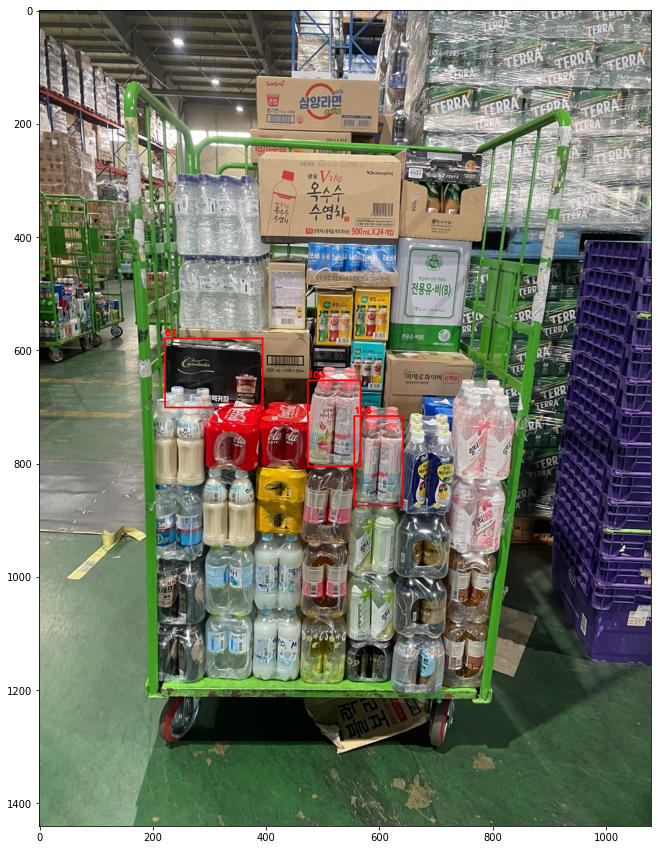

In [78]:
def draw_boxes_on_image(image_path, annotation_path):
    # 이미지 불러오기
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # csv 파일에서 Class ID와 Bounding Box 정보 읽기
    df = pd.read_csv(annotation_path)

    final_df = df
    #final_df = df[df['IoU'] >= 0.5].reset_index(drop = True)

    for i in range(len(final_df)):
      class_id = final_df.loc[i, 'label']
      x_min, y_min, x_max, y_max = final_df.loc[i, 'xmin'], final_df.loc[i, 'ymin'], final_df.loc[i, 'xmax'], final_df.loc[i, 'ymax']

      # 이미지에 바운딩 박스 그리기
      cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
      cv2.putText(image, str(class_id), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # 이미지와 바운딩 박스 출력
    plt.figure(figsize=(15, 15))
    plt.imshow(image)

    plt.show()

# 0203, 0301, 0502, 0504, 0603 ,0801, 0802
# 0203 케이스 분석해보자

# 파일 경로 설정
image_file = '../content/validation/set1/cart_3.jpg'
annotation_file = '../content/validation/set1/plus_iou_cart_3.csv'

# 함수 실행
draw_boxes_on_image(image_file, annotation_file)

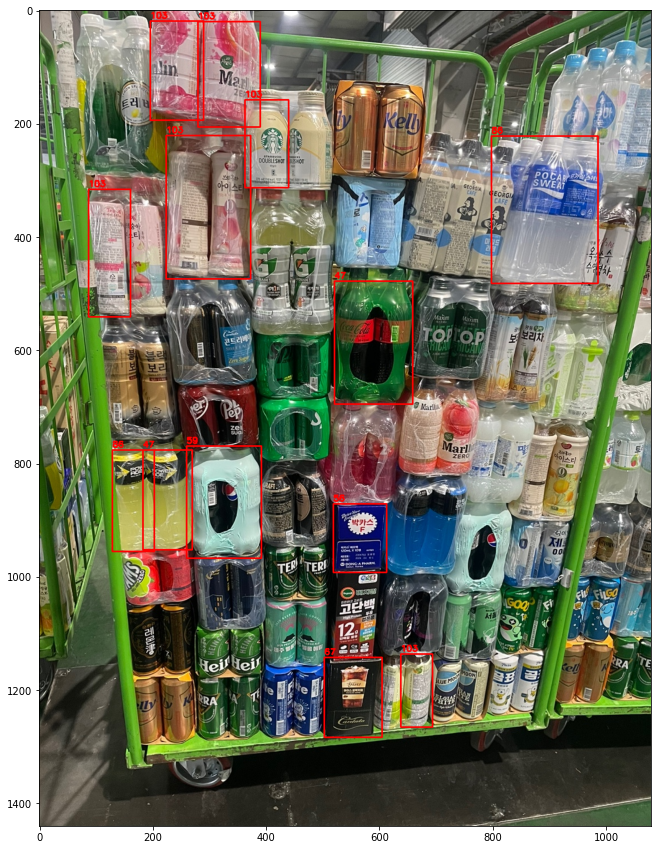

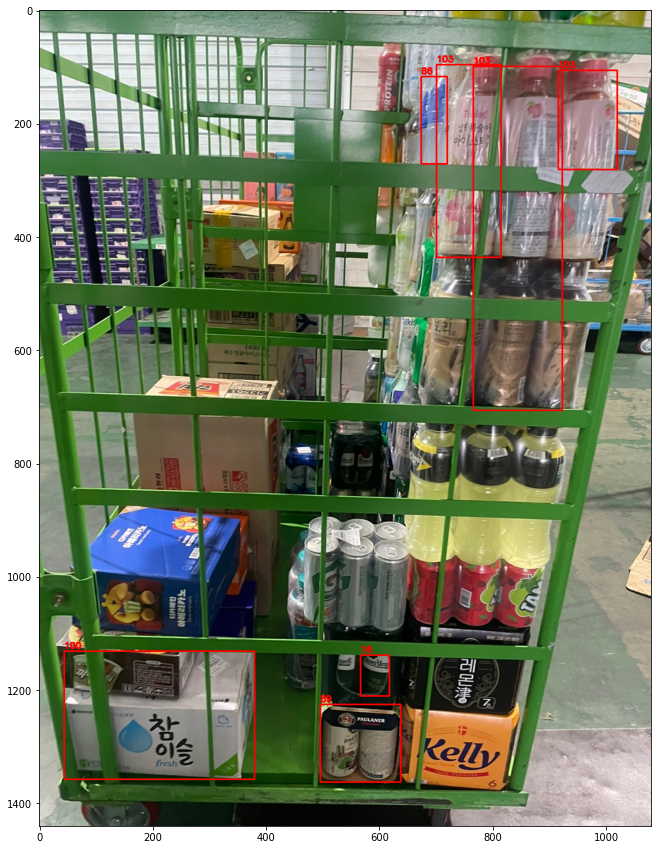

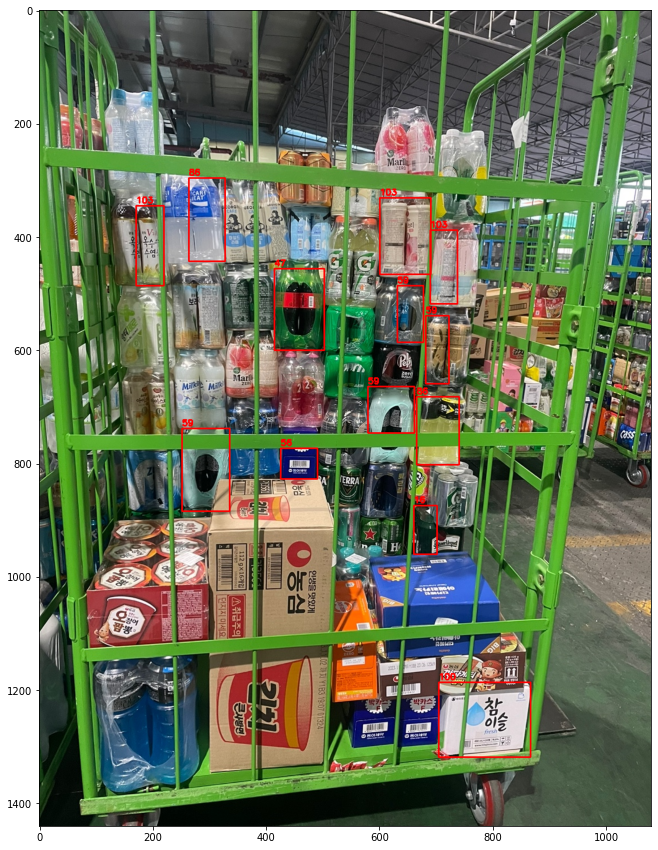

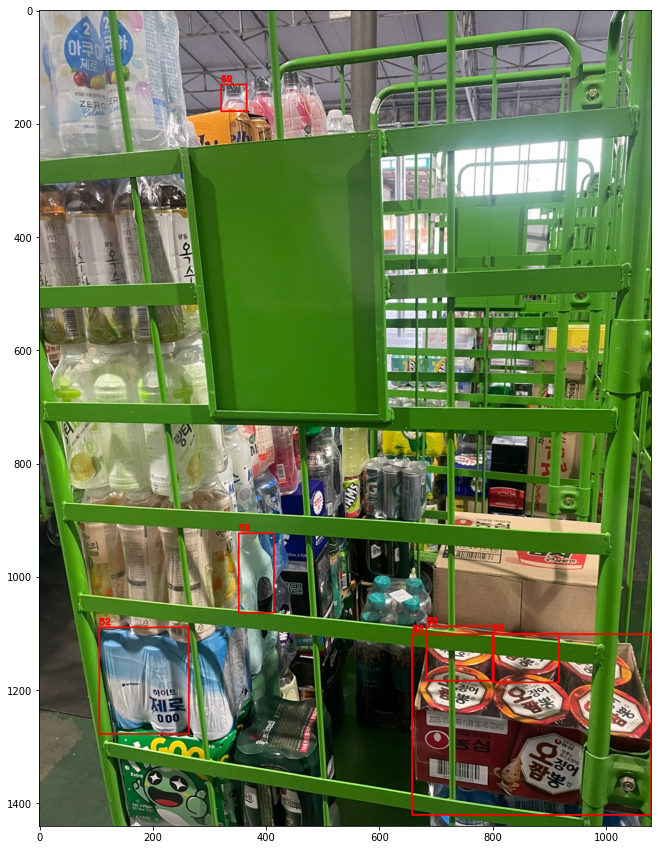

In [44]:
def draw_boxes_on_image(image_path, annotation_path):
    # 이미지 불러오기
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # csv 파일에서 Class ID와 Bounding Box 정보 읽기
    df = pd.read_csv(annotation_path)

    final_df = df
    #final_df = df[df['IoU'] >= 0.5].reset_index(drop = True)

    for i in range(len(final_df)):
      class_id = final_df.loc[i, 'label']
      x_min, y_min, x_max, y_max = final_df.loc[i, 'xmin'], final_df.loc[i, 'ymin'], final_df.loc[i, 'xmax'], final_df.loc[i, 'ymax']

      # 이미지에 바운딩 박스 그리기
      cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
      cv2.putText(image, str(class_id), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # 이미지와 바운딩 박스 출력
    plt.figure(figsize=(15, 15))
    plt.imshow(image)

    plt.show()

# 0203, 0301, 0502, 0504, 0603 ,0801, 0802
# 0203 케이스 분석해보자

for i in range(1, 5):
    # 파일 경로 설정
    image_file = f'../content/validation/set10/cart_100{i}.jpg'
    annotation_file = f'../content/validation/set10/plus_iou_cart_100{i}.csv'

    # 함수 실행
    draw_boxes_on_image(image_file, annotation_file)

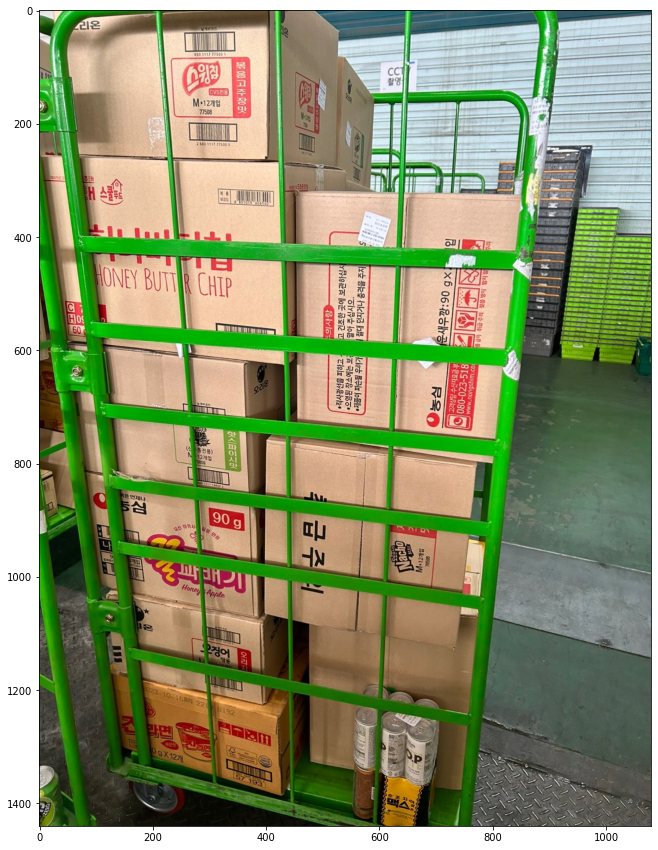

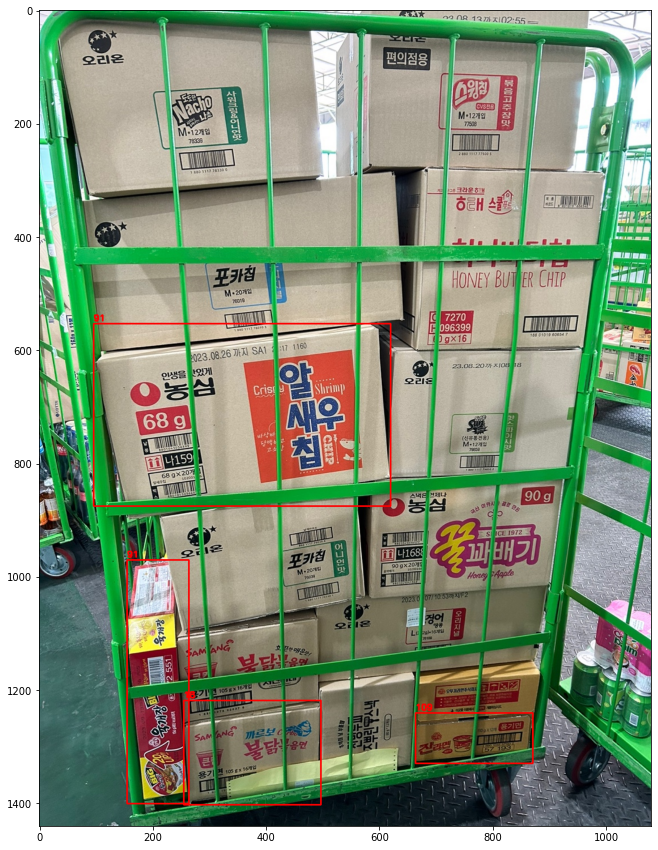

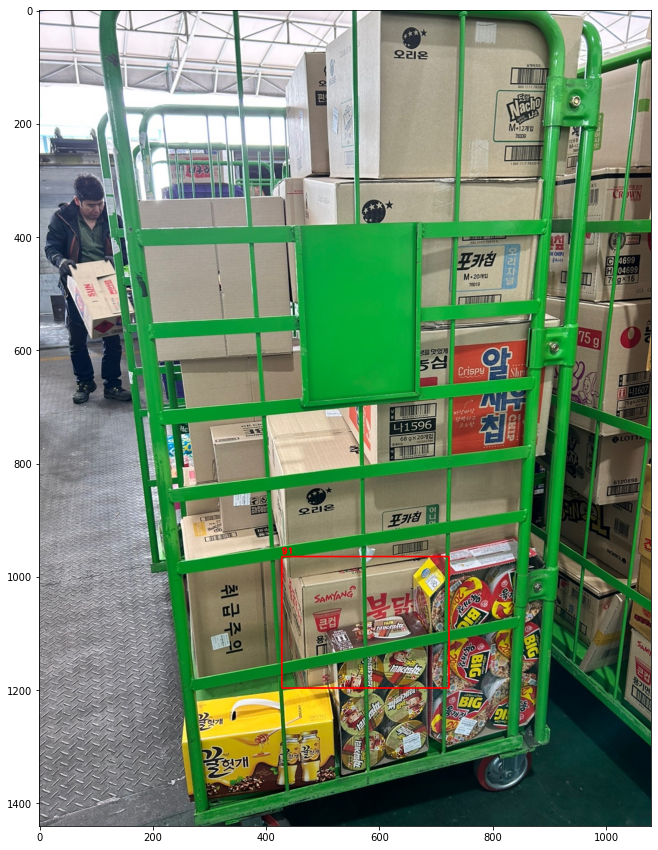

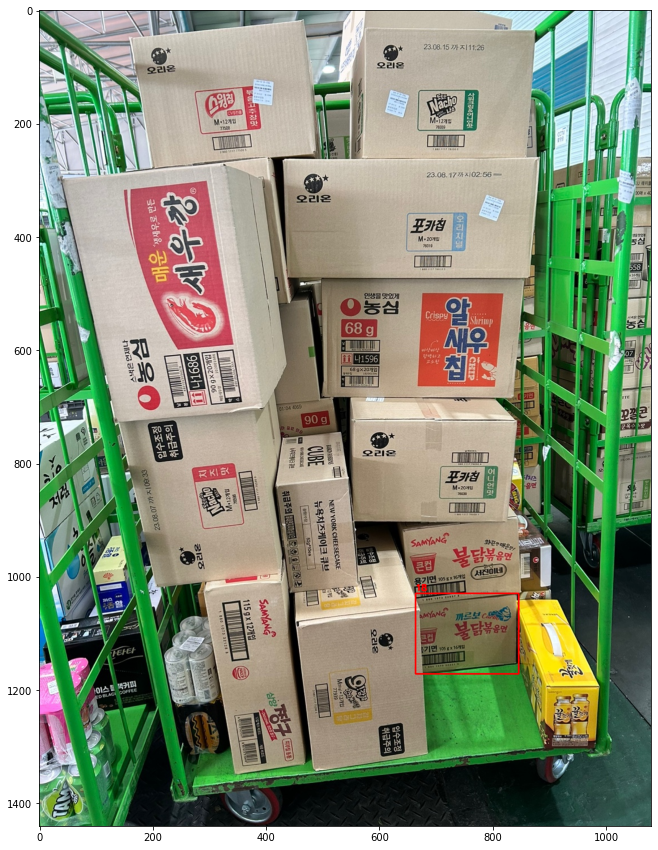

In [45]:
def draw_boxes_on_image(image_path, annotation_path):
    # 이미지 불러오기
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # csv 파일에서 Class ID와 Bounding Box 정보 읽기
    df = pd.read_csv(annotation_path)

    final_df = df
    #final_df = df[df['IoU'] >= 0.5].reset_index(drop = True)

    for i in range(len(final_df)):
      class_id = final_df.loc[i, 'label']
      x_min, y_min, x_max, y_max = final_df.loc[i, 'xmin'], final_df.loc[i, 'ymin'], final_df.loc[i, 'xmax'], final_df.loc[i, 'ymax']

      # 이미지에 바운딩 박스 그리기
      cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
      cv2.putText(image, str(class_id), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # 이미지와 바운딩 박스 출력
    plt.figure(figsize=(15, 15))
    plt.imshow(image)

    plt.show()

# 0203, 0301, 0502, 0504, 0603 ,0801, 0802
# 0203 케이스 분석해보자

for i in range(1, 5):
    # 파일 경로 설정
    image_file = f'../content/validation/set1/cart_010{i}.jpg'
    annotation_file = f'../content/validation/set1/plus_iou_cart_010{i}.csv'

    # 함수 실행
    draw_boxes_on_image(image_file, annotation_file)

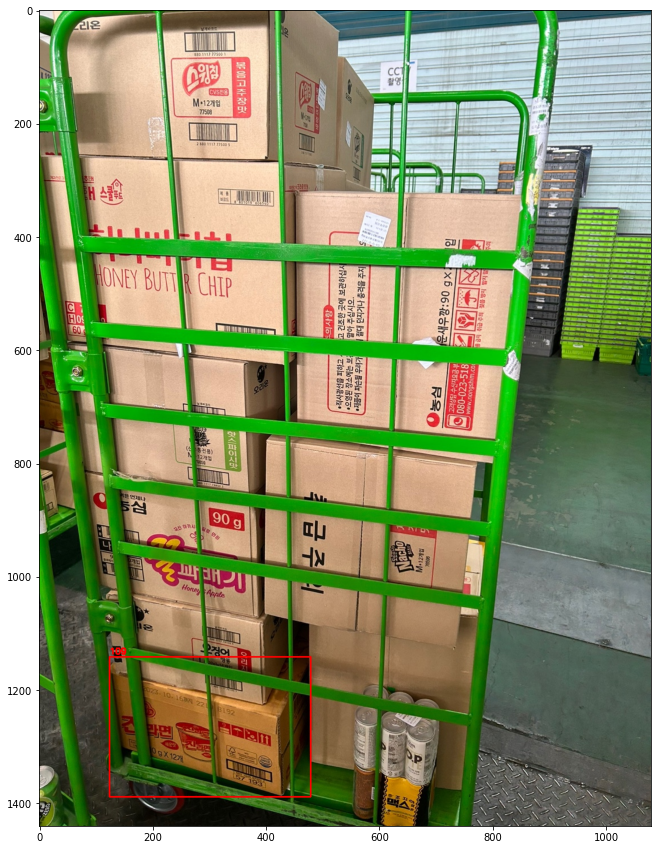

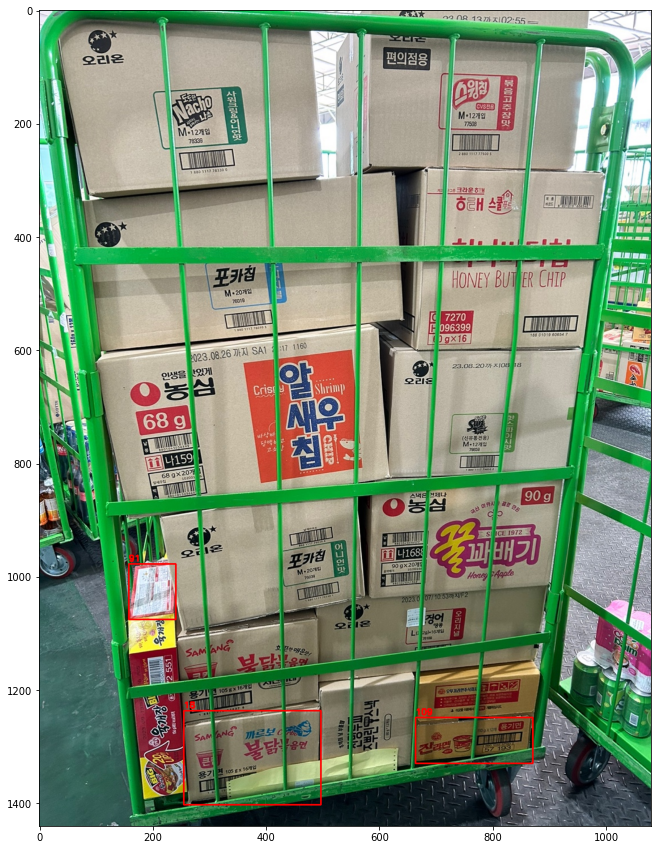

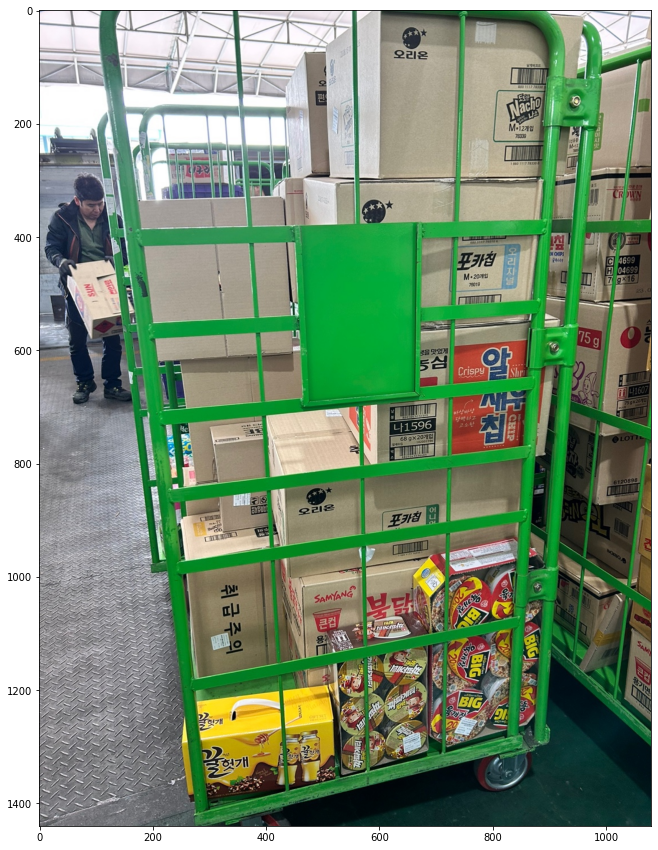

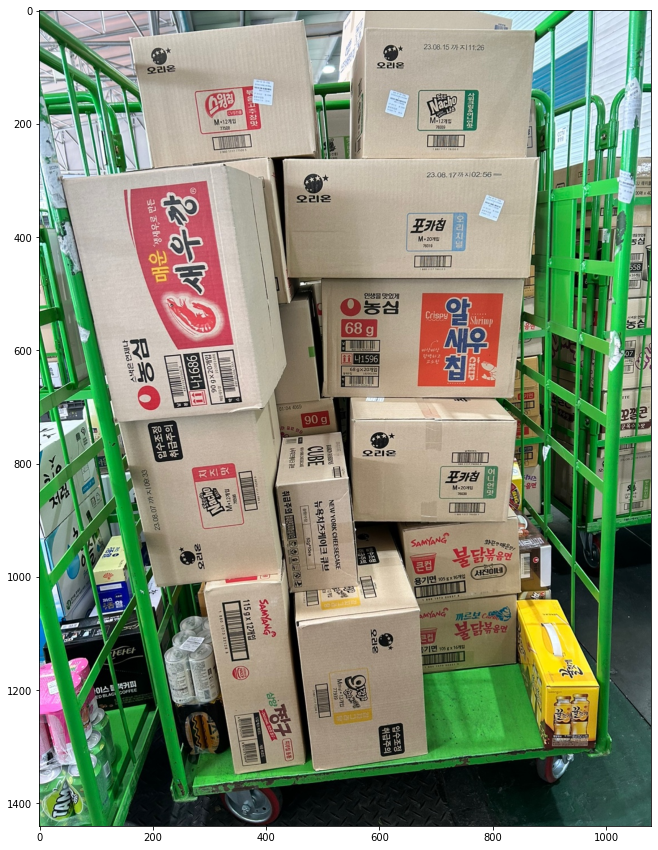

In [100]:
def draw_boxes_on_image(image_path, annotation_path):
    # 이미지 불러오기
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # csv 파일에서 Class ID와 Bounding Box 정보 읽기
    df = pd.read_csv(annotation_path)

    final_df = df
    #final_df = df[df['IoU'] >= 0.5].reset_index(drop = True)

    for i in range(len(final_df)):
      class_id = final_df.loc[i, 'label']
      x_min, y_min, x_max, y_max = final_df.loc[i, 'xmin'], final_df.loc[i, 'ymin'], final_df.loc[i, 'xmax'], final_df.loc[i, 'ymax']

      # 이미지에 바운딩 박스 그리기
      cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
      cv2.putText(image, str(class_id), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # 이미지와 바운딩 박스 출력
    plt.figure(figsize=(15, 15))
    plt.imshow(image)

    plt.show()

# 0203, 0301, 0502, 0504, 0603 ,0801, 0802
# 0203 케이스 분석해보자

for i in range(1, 5):
    # 파일 경로 설정
    image_file = f'../content/validation/set1/cart_010{i}.jpg'
    annotation_file = f'../content/validation/set1/plus_iou_cart_010{i}.csv'

    # 함수 실행
    draw_boxes_on_image(image_file, annotation_file)

## Analysis Tool (Grad-CAM)
# 모델이 분류의 근거로 삼은 feature map 주요 부분을 관찰 → 모델이 잘못 바라봤을 경우에 대해 분석, 개선 과정을 진행

In [ ]:
!pip install grad-cam

In [ ]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [ ]:
target_layers = [model2.model.blocks[-1].norm1]

def reshape_transform(tensor, height=16, width=16):
    result = tensor[:, 1 :  , :].reshape(tensor.size(0),
        height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result

cam = GradCAM(model=model2.model, target_layers=target_layers, reshape_transform=reshape_transform)

In [ ]:
def analysis_image(image, target_class):
  img = cv2.resize(image, [224, 224])
  img = np.expand_dims(img, axis = 0)
  img = torch.FloatTensor(img).permute(0,3,1,2)
  input_tensor = img.cuda()

  targets = [ClassifierOutputTarget(target_class)]

  Cam = cam(input_tensor = input_tensor, targets = targets)

  img2 = cv2.resize(image, [224, 224]) / 255.

  Cam = np.expand_dims(np.squeeze(Cam, axis = 0), axis = -1)

  visualization = show_cam_on_image(img2.astype(np.float32), Cam, use_rgb = True)

  # colab에서 실행하기 때문에 cv2.imshow 대신 cv2_imshow 함수 이용
  cv2_imshow(visualization)

In [ ]:
# an_df = pd.read_csv('/content/validation/set2/cart_0203.csv')

In [ ]:
#  tmp_df = an_df[an_df['label'] == 47].reset_index(drop = True)
#  box_list = tmp_df['box_img_path'].values

In [ ]:
# image = cv2.imread(box_list[2])
# # 원본 show
# cv2_imshow(image)
# # grad cam show
# analysis_image(image, 47)

In [ ]:
# requirements.txt파일 만들기
!pip list --format=freeze > requirements.txt